### GiHub Repo

In [110]:
"""
https://github.com/caglanakpinar/dropoff-distance-prediction.git
"""
print()

In [108]:
### chech requirement_pip.txt for libraries
"""
!pip install pandas
!pip install numpy
!pip install pygeohash
!pip install display
!pip install matplotlib
!pip install plotly
!pip install datetime
!pip install scipy
!pip install seaborn
!pip install tensorflow
!pip install keras-tuner
!pip install scikit-learn
!pip install PyYAML

"""
print()

In [1]:
import pandas as pd
import numpy as np
import pygeohash as pgh
from IPython.display import display, HTML
display(HTML('<style>.container { width:90% !important; }</style>'))
import plotly.express as px
from math import sqrt
import datetime
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import abspath, join
import yaml

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.regularizers import l1, l2, l1_l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.models import model_from_json

from kerastuner.tuners import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters

## configs

In [3]:
directory = abspath("")
params_tunned_file = "tunned_parameters.yaml"
model_file = join(directory, "trained_model.json")
weight_file = join(directory, "weight.h5")
directory

'/Users/caglanakpinar/Desktop/Analytics/dh'

### data access

In [4]:
data = pd.read_json("location_task_no_nulls.json")

In [5]:
print(round(data.memory_usage().sum() / 1000000000, 2), "GB") # check memory use to make sure that it is not cause the lack of available memory

0.21 GB


In [6]:
data.head()

,order_id,order_value,order_items_count,customer_id,created_timestamp_local,has_instruction,logistics_dropoff_distance,delivery_postal_code,delivery_geohash_precision8,has_phone_number,has_call_instruction,has_leave_instruction,has_lift_instruction,has_lobby_instruction,has_gate_instruction,has_knock_instruction,has_bell_instruction
618,b8ds-tqhf,40.44,10,h6huq0td,2021-03-11T20:19:50,True,58.656138,828868,w23bh248,False,False,False,False,False,False,False,False
619,x5xx-j2d2,35.60,10,t2nod4rq,2021-03-12T18:42:48,True,39.025148,530548,w21zu55k,False,False,False,False,False,False,False,False
620,x6qu-14kt,42.49,12,m4ycd3tm,2021-03-27T11:29:17,True,40.067811,650248,w21z9jc4,False,False,True,False,False,False,False,False
621,x3yw-rhc5,14.40,11,sgmnf9sb,2021-03-02T22:08:52,True,44.986785,550105,w21zg97y,False,False,False,False,False,False,False,False
622,y9zp-58q7,38.15,10,x4rvv3iy,2021-03-23T20:35:26,True,71.520828,102112,w21z61q6,False,False,False,False,False,False,False,False


## Initial Exploratations
- I have randomly selected a metric and play with data.
- This is an unstructured process that I add anything which is coming to my mind.
- In My playground, I normally used some instruments;
    - checking the distributor of data (logistics_dropoff_distance Distribution)
    - Aggregated Frequency of Categorical Metrics (customer_id Order Count Histogram)
    - Average logistics_dropoff_distance per metric (average logistics_dropoff_distance per order_items_count)
    - This process will give an idea for Feature Engineering

#### 1. distribution of logistics_dropoff_distance
    - After converting to logistic form It might shape as Left Skewed Normal Distribution

In [7]:
fig = px.histogram(data.query("logistics_dropoff_distance < 100").sample(30000), x="logistics_dropoff_distance")
fig.show()

#### 2. mean & median & max & min of logistics_dropoff_distance
- Max value of logistics_dropoff_distance (15328253.689635966) seems huge for the Distribution above.
- That gives me idea of I need to remove outliers, That might affect my prediction model.

In [8]:
feature = list(data["logistics_dropoff_distance"])
np.mean(feature), np.median(feature), max(feature), min(feature)

(93.53974218105627, 37.984519135, 15328253.689635966, 0.0)

#### 3. order count distribution per customers
- There is a user (a1hqj0ax) who has 311 in 30 days. This might be a world record :) This customer also has orders within 3 seconds. 
- However, the Order Count Distribution seems like any usual Delivery Service Providers of the customer - order Count distribution. So, nothing seems awkward in general.

In [9]:
cust_orders = data.groupby("customer_id").agg(
    {"order_id": lambda x: len(np.unique(x))}).reset_index().rename(
    columns={"order_id": "order_count"}).sort_values('order_count', ascending=False)
display(cust_orders.head(7))
fig = px.histogram(cust_orders.sample(10000), x="order_count")
fig.show()

,customer_id,order_count
1448,a1hqj0ax,311
326595,sgijd3to,143
279555,sgdg7scy,125
283927,sgdtqv9x,125
554286,y9upa2tt,122
110116,j9lcy7pz,117
242047,sg82g3lk,114


#### 3.  I would like to see that if the total number of order count per hour increases, how logistics_dropoff_distance changes.
- I wonder any significant positive/negative correlation between order count per customer and logistics_dropoff_distance.

In [10]:
cust_orders_distance = pd.merge(data, cust_orders, on='customer_id', how='left').groupby("order_count").agg(
    {"logistics_dropoff_distance": "mean"}).reset_index()
display(cust_orders_distance.head())
fig = px.bar(cust_orders_distance, x='order_count', y='logistics_dropoff_distance')
fig.show()

,order_count,logistics_dropoff_distance
0,1,164.620767
1,2,80.386044
2,3,78.213665
3,4,76.755556
4,5,73.733227


#### 4. ratio of 1st order customers
- This is not the customers first order, it is first order trancation at the data that is provided.

In [11]:
len(cust_orders.query("order_count == 1")) / len(cust_orders)

0.3393463696337541

#### 5. delivery_geohash_precision8 decoding to lat - lon

In [12]:
data['location'] = data['delivery_geohash_precision8'].apply(lambda x: pgh.decode(x))

In [13]:
cust_location = data.groupby("location").agg(
    {"customer_id": lambda x: len(np.unique(x)), 'logistics_dropoff_distance': 'mean',
     'order_id': 'count', 'order_value': 'mean'}
).reset_index().rename(columns={"customer_id": "unique_cust_count", 
                                'order_id': 'order_count', 'order_value': 'avg_order_value'}
                      ).sort_values('unique_cust_count', ascending=False)

cust_location['lat'] = cust_location['location'].apply(lambda x: x[0])
cust_location['lon'] = cust_location['location'].apply(lambda x: x[1])
cust_location.head(7)

,location,unique_cust_count,logistics_dropoff_distance,order_count,avg_order_value,lat,lon
3284,"(1.306, 103.86)",854,81.888176,1441,25.862894,1.306,103.860
1680,"(1.293, 103.854)",654,93.559884,2641,21.462014,1.293,103.854
2407,"(1.3, 103.86)",491,73.021180,900,27.214756,1.300,103.860
1500,"(1.291, 103.837)",484,92.502808,1042,28.242390,1.291,103.837
809,"(1.281, 103.853)",443,108.380273,2962,25.417103,1.281,103.853
485,"(1.276, 103.837)",437,93.263275,2378,26.158579,1.276,103.837
3419,"(1.307, 103.833)",429,95.331517,1015,24.574719,1.307,103.833


#### 6.  Unique Customer Count at Location (GeoHash Decoded)
- Let`s see the whole Unique customer's pins on the map and see where are the most valuable market.

In [14]:
fig = px.density_mapbox(cust_location, lat='lat', lon='lon', z='unique_cust_count', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

#### 7.  DropOff Distance at Location (GeoHash Decoded) ( < 1000)
- Let`s check, is there any specific location that logistics_dropoff_distance is significantly higher than the other locations

In [15]:
fig = px.density_mapbox(cust_location.query("logistics_dropoff_distance < 1000"), lat='lat', lon='lon', z='logistics_dropoff_distance', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

#### 8. Order Count per Customer at Location (GeoHash Decoded)

In [16]:
fig = px.density_mapbox(cust_location, lat='lat', lon='lon', z='order_count', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

#### 9. geohash base average dropoff_distance with precision 7
- what if we change the precision of geohash with decoded location. In that case I expect decrease the resolution of the map.

In [17]:
data['dropoff_geohash_pre7'] = data['location'].apply(lambda x: pgh.encode(latitude=x[0], longitude=x[1], precision=7))
data['location_pre7'] = data['dropoff_geohash_pre7'].apply(lambda x: pgh.decode(x))

In [18]:
cust_location_pre7 = data.groupby("location_pre7").agg(
    {"customer_id": lambda x: len(np.unique(x)), 'logistics_dropoff_distance': 'mean',
     'order_id': 'count', 'order_value': 'mean'}
    
    
).reset_index().rename(columns={"customer_id": "unique_cust_count", 
                                'order_id': 'order_count', 'order_value': 'avg_order_value'}
                      ).sort_values('unique_cust_count', ascending=False)


cust_location_pre7['lat_pre7'] = cust_location_pre7['location_pre7'].apply(lambda x: x[0])
cust_location_pre7['lon_pre7'] = cust_location_pre7['location_pre7'].apply(lambda x: x[1])


In [19]:
fig = px.density_mapbox(cust_location_pre7, lat='lat_pre7', lon='lon_pre7', z='order_count', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

In [20]:
fig = px.density_mapbox(cust_location_pre7, lat='lat_pre7', lon='lon_pre7', z='unique_cust_count', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

In [21]:
fig = px.density_mapbox(cust_location_pre7, lat='lat_pre7', lon='lon_pre7', z='logistics_dropoff_distance', radius=10,
                        center=dict(lat=1.34, lon=103.86), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

####  10. number of delivery_postal_code == number of delivery_geohash_precision8 ?
- I wonder is there any one-to-one relation between delivery_postal_code and delivery_geohash_precision8

In [22]:
len(data['delivery_postal_code'].unique()), len(data['delivery_geohash_precision8'].unique())

(47891, 119673)

#### 11. number of customers who have only 1 order

In [23]:
len(cust_location.query("unique_cust_count == 1")) / len(cust_location)

0.12460001939299913

#### 12. number of geohash locations

In [24]:
len(data['delivery_geohash_precision8'].unique())

119673

#### 13. Customer Location Of Unique Customer Count (geoHash precision=8)

In [25]:
fig = px.histogram(cust_location, x="unique_cust_count")
fig.show()

#### 14. dropoff_distance Breakdown With Hour & Week Of Day
    - created_timestamp_local is local timestamp, so, we can pretent like rush hour range 17 - 23 and 12 - 14

In [26]:
def convert_to_date(date):
    """
    Convert str date to datetime. If is NULL skip the process and return None.
    :param date: str format; %Y-%m-%d %H:%M:%S
    :return:
    """
    if date == date:
        return datetime.datetime.strptime(str(date)[0:10] + ' ' + str(date)[11:19], "%Y-%m-%d %H:%M:%S")
    else:
        return None

In [27]:
def convert_dt_to_day_str(date):
    """
    converting date time to str date. e.g; 2020-12-12 00:00:14  - 2020-12-12.
    :param date: datetime format; %Y-%m-%d %H:%M:%S
    :return: string date
    """
    return datetime.datetime.strptime(str(date)[0:10], "%Y-%m-%d")

In [28]:
data['created_timestamp_local'] = data['created_timestamp_local'].apply(lambda x: convert_to_date(x))
data['created_ts_hour']  = data['created_timestamp_local'].apply(lambda x: x.hour)
data['created_ts_day']  = data['created_timestamp_local'].apply(lambda x: convert_dt_to_day_str(x))
data['weekday']  = data['created_ts_day'].apply(lambda x: 'weekend' if x.isoweekday() in [6, 7] else 'week')

# day parts dictionary
day_part = {}
for h in range(0, 24):
    if h in [0, 22, 23]:
        day_part[h] = '[22 - 1)' 
    if h in range(1, 8):
        day_part[h] = '[1 - 8)' 
    if h in range(8, 12):
        day_part[h] = '[8 - 12)' 
    if h in range(12, 16):
        day_part[h] = '[12 - 16)' 
    if h in range(16, 23):
        day_part[h] = '[12 - 16)' 
        
data['day_part']  = data['created_ts_hour'].apply(lambda x: day_part[x])

# total order count & average of logistics_dropoff_distance per hour
hourly_orders = data.groupby("created_ts_hour").agg(
    {"order_id": "count", 'logistics_dropoff_distance': 'mean'}
).reset_index().rename(columns={"order_id": "average_hourly_order_count", "logistics_dropoff_distance": "avg_logistics_dropoff_distance_per_hour"})

In [29]:
# total order count & average of logistics_dropoff_distance per week part(weekend/weekday)
days_of_orders = data.groupby("weekday").agg(
    {"order_id": "count", 'logistics_dropoff_distance': 'mean'}
).reset_index().rename(columns={"order_id": "average_weekday_order_count", "logistics_dropoff_distance": "avg_logistics_dropoff_distance_per_weekday"})

In [30]:
# total order count & average of logistics_dropoff_distance per day part
day_part_orders = data.groupby("day_part").agg(
    {"order_id": "count", 'logistics_dropoff_distance': 'mean'}
).reset_index().rename(columns={"order_id": "average_day_part_order_count", "logistics_dropoff_distance": "avg_logistics_dropoff_distance_per_day_part"})

In [31]:
fig = px.bar(hourly_orders, x='created_ts_hour', y='average_hourly_order_count')
fig.show()

In [32]:
fig = px.bar(hourly_orders, x='created_ts_hour', y='avg_logistics_dropoff_distance_per_hour')
fig.show()

In [33]:
fig = px.bar(days_of_orders, x='weekday', y='average_weekday_order_count')
fig.show()

In [34]:
fig = px.bar(days_of_orders, x='weekday', y='avg_logistics_dropoff_distance_per_weekday')
fig.show()

In [35]:
fig = px.bar(day_part_orders, x='day_part', y='average_day_part_order_count')
fig.show()

In [36]:
fig = px.bar(day_part_orders, x='day_part', y='avg_logistics_dropoff_distance_per_day_part')
fig.show()

#### 15. binary features

In [37]:
binary_features = ["has_bell_instruction", "has_call_instruction", 
                   "has_gate_instruction", "has_instruction", "has_knock_instruction", "has_leave_instruction", 
                   "has_lift_instruction", "has_lobby_instruction", "has_phone_number"]
metric = "logistics_dropoff_distance"
for f in binary_features:
    _data = data.groupby(f).agg({"logistics_dropoff_distance": "mean"}).reset_index()
    print("feature :", f, " - False : ", list(data.query(f + " == False")[metric])[0], " || True :", list(data.query(f + " == True")[metric])[0])

feature : has_bell_instruction  - False :  58.6561378035  || True : 6.8058506434
feature : has_call_instruction  - False :  58.6561378035  || True : 85.347529371
feature : has_gate_instruction  - False :  58.6561378035  || True : 43.3916679432
feature : has_instruction  - False :  46.6783489513  || True : 58.6561378035
feature : has_knock_instruction  - False :  58.6561378035  || True : 17.8261693408
feature : has_leave_instruction  - False :  58.6561378035  || True : 40.0678108544
feature : has_lift_instruction  - False :  58.6561378035  || True : 64.2780960177
feature : has_lobby_instruction  - False :  58.6561378035  || True : 64.2780960177
feature : has_phone_number  - False :  58.6561378035  || True : 36.0548270141


#### 16. order value distributions

In [38]:
fig = px.histogram(data.sample(30000), x="order_value")
fig.show()


#### 17. order_value - logistics_dropoff_distance correlation

In [39]:
vis = data.sample(1000)
fig = px.scatter(x=vis['order_value'], y=vis['logistics_dropoff_distance'])
fig.show()

#### 18. order_items_count - logistics_dropoff_distance Distribution

In [40]:
order_items_count = data.groupby("order_items_count").agg(
    {"logistics_dropoff_distance": "mean"}).reset_index().rename(columns={"logistics_dropoff_distance": "order_items_count_avg_d_dist"})

fig = px.bar(order_items_count, x='order_items_count', y='order_items_count_avg_d_dist')
fig.show()

#### 19. delivery_postal_code - logistics_dropoff_distance Frequency Distribution

In [41]:
delivery_postal_code = data.groupby("delivery_postal_code").agg(
    {"logistics_dropoff_distance": "mean"}).reset_index().rename(columns={"logistics_dropoff_distance": "delivery_postal_code_d_dist"})
delivery_postal_code['bins_vis'] = delivery_postal_code['delivery_postal_code_d_dist'].apply(lambda x: '+1000' if x > 1000 else int(x / 5) * 5)
delivery_postal_code['bins'] = delivery_postal_code['delivery_postal_code_d_dist'].apply(lambda x: int(x / 5) * 5)
fig = px.histogram(delivery_postal_code.sample(30000), x="bins_vis")
fig.show()

#### 20.  customer order sequence
- The first order and the last order per customer of dropoff distance might differ for the same customer location. Couriers might learn more about the location while the customer order count increases.

In [42]:
data['order_seq_per_cust'] = data.sort_values(["customer_id", "created_timestamp_local"], ascending=True).groupby("customer_id").cumcount() + 1
data.query("customer_id == 'h6huq0td'")[['order_seq_per_cust', "customer_id", "created_timestamp_local", "logistics_dropoff_distance"]].sort_values('created_timestamp_local')

,order_seq_per_cust,customer_id,created_timestamp_local,logistics_dropoff_distance
1051079,1,h6huq0td,2021-03-02 16:05:35,27.062018
2838516,2,h6huq0td,2021-03-02 19:11:49,28.727698
230698,3,h6huq0td,2021-03-04 11:52:00,25.557327
1137725,4,h6huq0td,2021-03-04 22:23:45,110.290163
2357508,5,h6huq0td,2021-03-06 12:36:45,38.619617
2898637,6,h6huq0td,2021-03-08 12:23:22,27.370465
2097172,7,h6huq0td,2021-03-08 19:34:41,38.285659
1311380,8,h6huq0td,2021-03-09 13:51:16,44.479391
618,9,h6huq0td,2021-03-11 20:19:50,58.656138
2005746,10,h6huq0td,2021-03-16 13:59:16,28.618764


In [43]:
max_order_seq_per_cust = data[['order_seq_per_cust', "customer_id"]]
max_order_seq_per_cust = max_order_seq_per_cust.groupby("customer_id").agg({"order_seq_per_cust": "max"}).reset_index().rename(columns={"order_seq_per_cust": "max_order_seq"})
max_order_seq_per_cust.head()

,customer_id,max_order_seq
0,COg1nox0xx-1,1
1,COi6dkx2uw-1,8
2,COn0wmq4qu-1,1
3,COp4akv8xq-1,1
4,COs5oka5ca-1,1


In [44]:
order_seq_per_cust = pd.merge(data[['order_seq_per_cust', "customer_id", "logistics_dropoff_distance"]], 
                              max_order_seq_per_cust, on="customer_id", how='left')
order_seq_per_cust.head()

,order_seq_per_cust,customer_id,logistics_dropoff_distance,max_order_seq
0,9,h6huq0td,58.656138,14
1,5,t2nod4rq,39.025148,6
2,7,m4ycd3tm,40.067811,8
3,1,sgmnf9sb,44.986785,2
4,14,x4rvv3iy,71.520828,17


In [45]:
order_seq_per_cust['min_max'] = order_seq_per_cust.apply(
    lambda row: 'first_order' if row['order_seq_per_cust'] == 1 else 'max' if row['order_seq_per_cust'] == row['max_order_seq'] else '-', axis=1)
order_seq_per_cust = order_seq_per_cust.query("min_max != '-'")
order_seq_per_cust.groupby("min_max").agg({"logistics_dropoff_distance": "mean"}).reset_index()

,min_max,logistics_dropoff_distance
0,first_order,133.783389
1,max,75.432551


## data cleanup
- In this section, I have check if I need to remove data points that I outlier of the logistics_dropoff_distance.
- Mean of logistics_dropoff_distance is **93.53**. However, we have data point with logistics_dropoff_distance is **15328253.68**. The main question here is **"Do we keep the outliers in our data set?"**
- These outliers might affect my prediction model.
- However, I need to keep the homogeneity of the data set. Otherwise, removing data might cause a bias problem.
- I try to remove data with Normal Distribution of tails, and quartile statistical method.
- I try also try not to remove and data.
- I check the correlation matrix and features of correlation values with logistics_dropoff_distance. In the end not to remove any data point. But further analysis, I keep this section even it is not applied to clean up data.

In [46]:
values = list(data['logistics_dropoff_distance'])
_mean = np.mean(values)
_var = np.var(values)
_sample_size = len(values)
_max = max(values)
_min = min(values)
### right tail of the normal distribution(alpha=001)
rigth_tail = _mean + (1.96 * (sqrt(_var) / sqrt(_sample_size)))
print(rigth_tail, _mean, _var, _sample_size, _max, _min)

113.6504097119842 93.53974218105627 273071985.7046165 2593799 15328253.689635966 0.0


In [47]:
rigth_tail_with_quartile = np.quantile(values, 0.99)

In [48]:
len(data.query("logistics_dropoff_distance > @rigth_tail")) / _sample_size

0.08265405299331213

In [49]:
len(data.query("logistics_dropoff_distance > @rigth_tail_with_quartile")) / _sample_size

0.010000003855348853

In [50]:
len(data.query("logistics_dropoff_distance > @rigth_tail_with_quartile")) 

25938

## Feature Engineering
- This process might be related to creativity and initial exploratory analysis of outputs and decisions might help us to create features.
- Some created features might affect our output feature (dropoff_distance), some might not. This might also be measured.
- Categorical Features might be converted to numeric form.

#### 1. GeoHash Decoding Latitude - Longitude
- Decoding GeoHash strings into the lat - lon form.
- It might be effective feature closest pins might have similar dropoff_distance values.
- trying to normalize lat - lon values with Min-Max Normalization
- By normalizing the Latitude and Longitude values, each point of correlation to the dropoff_distance values might be detected.

In [51]:
def min_max_norm(value, _min, _max):
    return (value - _min) / (_max - _min)

In [52]:
def calcualte_lambda(values):
    _unique, counts = np.unique(values, return_counts=True)
    return list(reversed(sorted(zip(counts, _unique))))[0][1]

In [53]:
data['lat'] = data['location'].apply(lambda x: x[0])
data['lon'] = data['location'].apply(lambda x: x[1])

In [54]:
_lat_min, _lat_max = min(data['lat']), max(data['lat'])
_lon_min, _lon_max = min(data['lon']), max(data['lon'])
data['lat_norm'] = data['lat'].apply(lambda x: min_max_norm(x, _lat_min, _lat_max))
data['lon_norm'] = data['lon'].apply(lambda x: min_max_norm(x, _lon_min, _lon_max))
data[['location', 'lat', 'lon', 'lat_norm', 'lon_norm']]

,location,lat,lon,lat_norm,lon_norm
618,"(1.406, 103.901)",1.406,103.901,0.724138,0.706704
619,"(1.38, 103.891)",1.380,103.891,0.612069,0.678771
620,"(1.35, 103.756)",1.350,103.756,0.482759,0.301676
621,"(1.37, 103.87)",1.370,103.870,0.568966,0.620112
622,"(1.282, 103.808)",1.282,103.808,0.189655,0.446927
...,...,...,...,...,...
2964434,"(1.429, 103.827)",1.429,103.827,0.823276,0.500000
2964435,"(1.448, 103.813)",1.448,103.813,0.905172,0.460894
2964436,"(1.352, 103.947)",1.352,103.947,0.491379,0.835196
2964437,"(1.445, 103.834)",1.445,103.834,0.892241,0.519553


#### 2.  geohash base average dropoff_distance with precision 8
- Average **logistics_dropoff_distance** per geohash with precision 8 with normalized values 

In [55]:
_min_dist, _max_dist = min(cust_location['logistics_dropoff_distance']), max(cust_location['logistics_dropoff_distance'])
cust_location['location_base_d_dist_norm'] = cust_location['logistics_dropoff_distance'].apply(lambda x: min_max_norm(x, _min_dist, _max_dist))
data = pd.merge(data, cust_location[['location', 'location_base_d_dist_norm']], on='location', how='left')

#### 3.  geohash base average dropoff_distance with precision 7
- While we convert geohash from precision 8 to 7 number of data points will decrease.
- This might give a more general idea for the location which covers more delivery location
- This feature is the average **logistics_dropoff_distance** per geohash with precision 7 with normalized values.

In [56]:
_min_dist, _max_dist = min(cust_location_pre7['logistics_dropoff_distance']), max(cust_location_pre7['logistics_dropoff_distance'])
cust_location_pre7['location_base_d_dist_pre7_norm'] = cust_location_pre7['logistics_dropoff_distance'].apply(lambda x: min_max_norm(x, _min_dist, _max_dist))
data = pd.merge(data, cust_location_pre7[['location_pre7', 'location_base_d_dist_pre7_norm']], on='location_pre7', how='left')

#### 4.  Binary Features
- True = 1; False = 0

In [57]:
binary_features = ["has_bell_instruction", "has_call_instruction", 
                   "has_gate_instruction", "has_instruction", "has_knock_instruction", "has_leave_instruction", 
                   "has_lift_instruction", "has_lobby_instruction", "has_phone_number"]
for f in binary_features:
    print("feature :", f)
    data[f] = data[f].apply(lambda x: 1 if x else 0)

feature : has_bell_instruction
feature : has_call_instruction
feature : has_gate_instruction
feature : has_instruction
feature : has_knock_instruction
feature : has_leave_instruction
feature : has_lift_instruction
feature : has_lobby_instruction
feature : has_phone_number


#### 5. order count per customer
- This feature is the number of order count per customer. 
- This feature will be normalized with Min-Max Normalization.

In [58]:
data = pd.merge(data, cust_orders, on='customer_id', how='left')
_min_order_count, _max_order_count = min(data['order_count']), max(data['order_count'])
_min_order_count, _max_order_count

(1, 311)

In [59]:
data['order_count_norm'] = data['order_count'].apply(lambda x: min_max_norm(x, _min_order_count, _max_order_count))

#### 6. Average logistics_dropoff_distance per hour
- if order created hour is an hour that has traffic, might affect dropoff distance.
- If it is nighttime, sight distance might drop and carrier deliver location discover might decrease.
- Courier of last hour of the shift, they might be tried and can not properly focus on the delivery location.

In [60]:
data = pd.merge(data, hourly_orders[['created_ts_hour', 'avg_logistics_dropoff_distance_per_hour']], on='created_ts_hour', how='left')
_min_avg_distance, _max_avg_distance = min(data['avg_logistics_dropoff_distance_per_hour']), max(data['avg_logistics_dropoff_distance_per_hour'])
_min_avg_distance, _max_avg_distance

(56.92556417226471, 693.106199452722)

In [61]:
data['avg_logistics_dropoff_distance_per_hour_norm'] = data['avg_logistics_dropoff_distance_per_hour'].apply(lambda x: min_max_norm(x, _min_avg_distance, _max_avg_distance))

#### 7. Average logistics_dropoff_distance per day part

In [62]:
data = pd.merge(data, day_part_orders[['day_part', 'avg_logistics_dropoff_distance_per_day_part']], on='day_part', how='left')
_min_avg_distance, _max_avg_distance = min(data['avg_logistics_dropoff_distance_per_day_part']), max(data['avg_logistics_dropoff_distance_per_day_part'])
data['avg_logistics_dropoff_distance_per_day_part_norm'] = data['avg_logistics_dropoff_distance_per_day_part'].apply(lambda x: min_max_norm(x, _min_avg_distance, _max_avg_distance))

#### 8. Average logistics_dropoff_distance per order_items_count
- Number of items in the order might encourage the courier to find the closest destination for the delivery location. They might not want to carry such a huge order by themselves.   

In [63]:
data = pd.merge(data, order_items_count[['order_items_count', 'order_items_count_avg_d_dist']], on='order_items_count', how='left')
_min_avg_distance, _max_avg_distance = min(data['order_items_count_avg_d_dist']), max(data['order_items_count_avg_d_dist'])
_min_avg_distance, _max_avg_distance
data['order_items_count_avg_d_dist_norm'] = data['order_items_count_avg_d_dist'].apply(lambda x: min_max_norm(x, _min_avg_distance, _max_avg_distance))

#### 9. Average logistics_dropoff_distance per delivery_postal_code
- Each delivery location might have individual circumstances. That is why individually they might have a special impact on dropoff location.

In [64]:
def calcualte_lambda(values):
    _unique, counts = np.unique(values, return_counts=True)
    return list(reversed(sorted(zip(counts, _unique))))[0][1]
    # return sum(list(map(lambda x: x[0] * x[1], zip(_unique, counts)))) / len(values)

In [65]:
lambda_parameter = calcualte_lambda(list(delivery_postal_code['bins']))
lambda_parameter

45

In [66]:
delivery_postal_code['delivery_postal_code_p_value'] = delivery_postal_code['bins'].apply(lambda x: 1 - stats.poisson.cdf(lambda_parameter, x))
delivery_postal_code

,delivery_postal_code,delivery_postal_code_d_dist,bins_vis,bins,delivery_postal_code_p_value
0,,244.711619,240,240,1.000000e+00
1,#01-40,41.735758,40,40,1.903499e-01
2,#04-48 S360005,42.895821,40,40,1.903499e-01
3,#06-1432,10.517033,10,10,1.110223e-16
4,#07-2512,20.379449,20,20,4.540179e-07
...,...,...,...,...,...
47886,singapore 670207,37.103460,35,35,4.247900e-02
47887,singapore 760150,175.119668,175,175,1.000000e+00
47888,singapore791467,29.006941,25,25,1.063587e-04
47889,• 791469,59.847508,55,55,9.027807e-01


In [67]:
data = pd.merge(data, delivery_postal_code[['delivery_postal_code', 'delivery_postal_code_p_value']], on='delivery_postal_code', how='left')

#### 10. logistics_dropoff_distance Normalization

In [68]:
_min_distance, _max_distance = min(data['logistics_dropoff_distance']), max(data['logistics_dropoff_distance'])
data['logistics_dropoff_distance_norm'] = data['logistics_dropoff_distance'].apply(lambda x: min_max_norm(x, _min_distance, _max_distance))

#### 11. order value normaliztion

In [69]:
_min_order_value, _max_order_value = min(data['order_value']), max(data['order_value'])
data['order_value_norm'] = data['order_value'].apply(lambda x: min_max_norm(x, _min_order_value, _max_order_value))

### Correlation of Features

In [70]:
y_feature = ["logistics_dropoff_distance_norm"]
x_features = ["delivery_postal_code_p_value", "order_value_norm", "order_count_norm",
              "order_items_count_avg_d_dist_norm", "avg_logistics_dropoff_distance_per_day_part_norm", 
              "avg_logistics_dropoff_distance_per_hour_norm", "location_base_d_dist_norm", "location_base_d_dist_pre7_norm",
            "lat_norm", "lon_norm"] + binary_features 
features = x_features + y_feature

In [71]:
corrr = data[features].corr()[['logistics_dropoff_distance_norm']]
corrr['logistics_dropoff_distance_norm'] = corrr['logistics_dropoff_distance_norm'].apply(lambda x: abs(x))
corrr.sort_values('logistics_dropoff_distance_norm', ascending=False).iloc[1:]

,logistics_dropoff_distance_norm
location_base_d_dist_norm,0.169805
location_base_d_dist_pre7_norm,0.015055
avg_logistics_dropoff_distance_per_hour_norm,0.004174
delivery_postal_code_p_value,0.002188
avg_logistics_dropoff_distance_per_day_part_norm,0.001951
order_items_count_avg_d_dist_norm,0.001862
has_instruction,0.000788
order_count_norm,0.000400
has_bell_instruction,0.000344
lon_norm,0.000324


In [72]:
def show_heatmap(data):
    mask = np.zeros_like(data, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    return sns.heatmap(data, mask=mask, cmap="Greens", vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}) 

<AxesSubplot:>

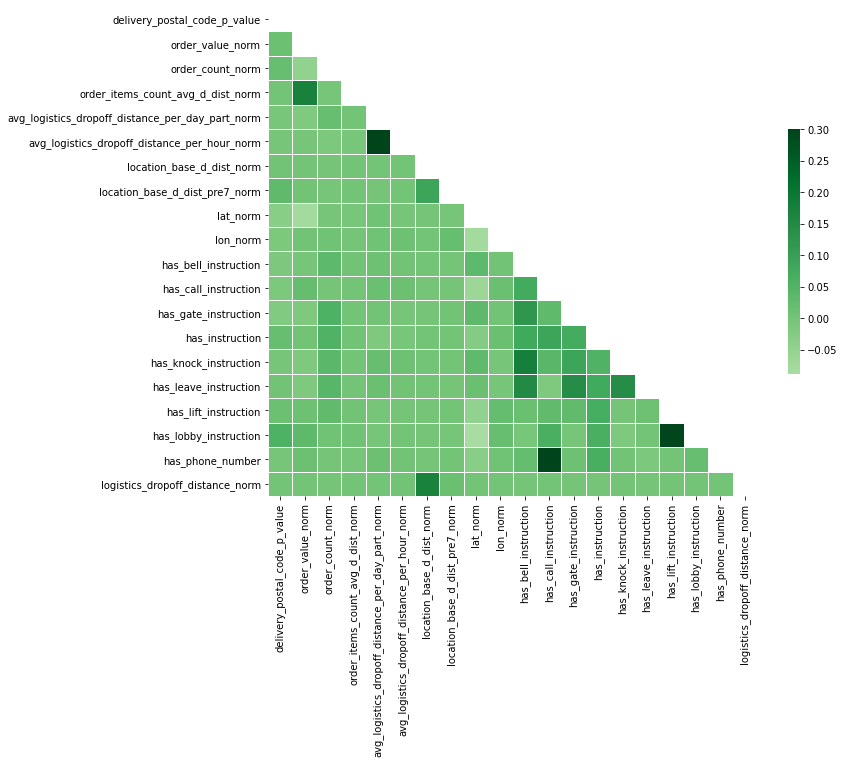

In [73]:
show_heatmap(data[features].corr())

## Feature Reduction
- In order to decrease model complexity let`s use PCA for the decision of Feature elimination
- First, sorting features according to correlation values
- checking each feature off the additional effect while adding to the feature set iteratively.
- Here is the process of Feature Reduction;
    - try; PCA with **delivery_postal_code_p_value**. calculate explained variance.
    - try; PCA with **delivery_postal_code_p_value & has_lobby_instruction**. calculate explained variance.
    - ...
    - try; PCA with **all features** calculate explained variance


#### 1. list of sorted Features Related to Correlation to the ***logistics_dropoff_distance_norm***

In [74]:
list(corrr.sort_values('logistics_dropoff_distance_norm', ascending=False).index)[1:]

['location_base_d_dist_norm',
 'location_base_d_dist_pre7_norm',
 'avg_logistics_dropoff_distance_per_hour_norm',
 'delivery_postal_code_p_value',
 'avg_logistics_dropoff_distance_per_day_part_norm',
 'order_items_count_avg_d_dist_norm',
 'has_instruction',
 'order_count_norm',
 'has_bell_instruction',
 'lon_norm',
 'order_value_norm',
 'has_gate_instruction',
 'has_leave_instruction',
 'has_knock_instruction',
 'has_call_instruction',
 'has_lift_instruction',
 'has_phone_number',
 'lat_norm',
 'has_lobby_instruction']

#### 2. explained variance calculation

In [75]:
def getPCA(x, componentNumber, isPrinting):
    for col in list(x.columns):
        x = x[x[col] == x[col]]
    pca = PCA(n_components=componentNumber)
    pca.fit(x)  
    x_pca = pca.transform(x)
    if isPrinting:
        print("components of Variance Ratio", pca.explained_variance_ratio_) 
    return pca.explained_variance_ratio_

In [76]:
comps = list(range(1,20)) # number of feature count
feaure_list = list(corrr.sort_values('logistics_dropoff_distance_norm', ascending=False).index)[1:]
explains = []
for comp in comps:
    # get top correlated features of normalized data
    _data = data[feaure_list[:comp+1]]
    # calculated pca and get the total explain variance as a result
    _explained_variance = getPCA(_data, componentNumber = comp, isPrinting = True)
    print("number of componnents: ", comp, " || explained varaince :", sum(_explained_variance))
    explains.append(sum(_explained_variance))

components of Variance Ratio [0.99445664]
number of componnents:  1  || explained varaince : 0.9944566396229619
components of Variance Ratio [0.90728895 0.09219712]
number of componnents:  2  || explained varaince : 0.9994860707807113
components of Variance Ratio [0.89558811 0.09473961 0.00961862]
number of componnents:  3  || explained varaince : 0.9999463349814431
components of Variance Ratio [0.70109425 0.2385658  0.05276832 0.00752962]
number of componnents:  4  || explained varaince : 0.999957990026436
components of Variance Ratio [7.00941864e-01 2.38513941e-01 5.27568576e-02 7.52798678e-03
 2.17349397e-04]
number of componnents:  5  || explained varaince : 0.9999579991595514
components of Variance Ratio [4.34673449e-01 3.80303334e-01 1.47554425e-01 3.26493692e-02
 4.65891740e-03 1.34512014e-04]
number of componnents:  6  || explained varaince : 0.9999740065583262
components of Variance Ratio [4.31740298e-01 3.77750655e-01 1.46558846e-01 3.24342533e-02
 6.72922178e-03 4.62730825e-

In [77]:
var_exp = pd.DataFrame(zip(explains, comps)).rename(columns={0: 'explained_variance', 1: 'number_of_feature'})
fig = px.line(var_exp, x="number_of_feature", y="explained_variance", title='Explained Variance & Number of Components')
fig.show()

In [78]:
explained_variance = pd.DataFrame(zip(feaure_list, _explained_variance)).rename(columns={0: "feature", 1: "explained_variance"})
fig = px.bar(explained_variance, x='feature', y='explained_variance')
fig.show()

#### 3. feature reduction rule
- if a feature explains variance is more than 1%, it is added to the feature set. 
- This decision is made after a couple of tries and see the results with feature sets "< 5%", "< 10%"

In [79]:
x_features = list(explained_variance.query("explained_variance > 0.01")['feature'])
x_features

['location_base_d_dist_norm',
 'location_base_d_dist_pre7_norm',
 'avg_logistics_dropoff_distance_per_hour_norm',
 'delivery_postal_code_p_value',
 'avg_logistics_dropoff_distance_per_day_part_norm',
 'order_items_count_avg_d_dist_norm',
 'has_instruction',
 'order_count_norm',
 'has_bell_instruction',
 'lon_norm',
 'order_value_norm',
 'has_gate_instruction',
 'has_leave_instruction',
 'has_knock_instruction']

## Train Process
- Feedforward NN with TensorFlow - Keras
- Why FFNN is selected for the predictive model?
    - Correlation of features is lower than expected. It might be non-linear relation to **logistics_dropoff_distance**.
- Another ML algorithm such as Random Forest can be implemented and compare the results.
- parameter tuning with Keras-tuner
- tunned parameters are imported to 'tunned_parameters.yaml' file
- trained model and weights are stored to 'trained_model.json' and 'weight.h5' files.

#### 1 . train - test split (train 75 %,  test 25 %)

In [80]:
X = data[x_features]
Y = data[y_feature]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1945349, 14) (648450, 14) (1945349, 1) (648450, 1)


#### 2 . parameter tuning

In [81]:
params = {'epochs': 10, 
          'batch_size': 128, 
          'activation': 'tanh', 
          'h_l_unit': 64,'hidden_layer_count': 5, 
          'loss': 'mse', 'drop_out_ratio': 0.2, 'lr': 0.001, 'l1': .001, 'l2': .001} 
hyper_params = {'activation': ['tanh', 'relu'],
                'batch_size': 128,
                'h_l_unit': [256, 128, 64, 32, 16], 'hidden_layer_count': [2, 3, 4, 5, 6], 
                'loss': ['mse'], 
                'drop_out_ratio': [.05, .1, .15, .2], 
                'lr': [.001, .002, .003, .004, .005, .01, .05],
                'l1': [.001, .002, .003, .004, .005], 
                'l2': [.001, .002, .003, .004, .005]} 

In [82]:
hp = HyperParameters()

In [83]:
def build_parameter_tuning_model(hp):
    _input = Input(shape=(X_train.shape[1],))
    _unit = hp.Choice('h_l_unit', hyper_params['h_l_unit'])
    _layer = Dense(hp.Choice('h_l_unit', hyper_params['h_l_unit']),
                   activation=hp.Choice('activation', hyper_params['activation'])
                   )(_input)
    
    for i in range(1, hp.Choice('hidden_layer_count', hyper_params['hidden_layer_count'])):
        _unit = _unit / 2
        _layer = Dense(_unit,
                       activation=hp.Choice('activation', hyper_params['activation'])
                       )(_layer)
        
    output = Dense(1, activation='sigmoid')(_layer)
    model = Model(inputs=_input, outputs=output)
    model.compile(loss=hyper_params['loss'],
                  optimizer=Adam(lr=hp.Choice('lr', hyper_params['lr'])))
    return model

In [84]:
parameter_tuning_trials = 10 # number of parameter tunning trials

In [85]:
def read_yaml(directory, filename):
    """
    reading .yaml file as key, value format
    """
    try:
        with open(join(directory, "", filename)) as file:
            docs = yaml.full_load(file)
        return docs
    except:
        return None
        
def write_yaml(directory, filename, data, ignoring_aliases=False):
    """
    writing dictionary to .yaml file
    """
    if ignoring_aliases:
        yaml.Dumper.ignore_aliases = lambda *args : True

    with open(join(directory, "", filename), 'w') as file:
        if ignoring_aliases:
            yaml.dump(data, file, default_flow_style=False)
        else:
            yaml.dump(data, file)
            
def model_from_to_json(path=None, weights_path=None, model=None, is_writing=False, lr=None):
    """
    writing & reading Keras model
    Keras model (.json) and optimized weight matrix (.h5)
    """
    if is_writing:
        model_json = model.to_json()
        with open(path, "w") as json_file:
            json_file.write(model_json)
        model.save_weights(weights_path)
    else:
        try:
            json_file = open(path, 'r')
            loaded_model_json = json_file.read()
            json_file.close()
            model = model_from_json(loaded_model_json)
            model.load_weights(weights_path)
            return model
        except Exception as e:
            print(e)
            return {}

In [86]:
if read_yaml(directory, params_tunned_file) is None:
    kwargs = {'directory': directory}
    tuner = RandomSearch(build_parameter_tuning_model,
                         max_trials=parameter_tuning_trials,
                         hyperparameters=hp,
                         allow_new_entries=True,
                         objective='loss', **kwargs)
    tuner.search(x=X_train,
                 y=Y_train,
                 epochs=5,
                 batch_size=hyper_params['batch_size'],
                 verbose=1,
                 validation_data=(X_test, Y_test))
    for p in tuner.get_best_hyperparameters()[0].values:
        if p in list(params.keys()):
            params[p] = tuner.get_best_hyperparameters()[0].values[p]
            
    write_yaml(directory, params_tunned_file, params, ignoring_aliases=False)
else:
    params = read_yaml(directory, params_tunned_file)  

Trial 10 Complete [00h 07m 37s]
loss: 1.5493695855184342e-06

Best loss So Far: 1.5493335467908764e-06
Total elapsed time: 01h 14m 23s
INFO:tensorflow:Oracle triggered exit


In [87]:
### tunned parameters
params

{'epochs': 10,
 'batch_size': 128,
 'activation': 'tanh',
 'h_l_unit': 128,
 'hidden_layer_count': 3,
 'loss': 'mse',
 'drop_out_ratio': 0.2,
 'lr': 0.001,
 'l1': 0.001,
 'l2': 0.001}

#### 3.  train NN model

In [88]:
def build_model():
    _input = Input(shape=(X_train.shape[1],))
    _unit = params['h_l_unit']
    _layer = Dense(params['h_l_unit'],
                   activation=params['activation']
                   )(_input)
    
    for i in range(1, params['hidden_layer_count']):
        _unit = _unit / 2
        _layer = Dense(_unit, activation=params['activation'])(_layer)
    
    output = Dense(1, activation='sigmoid')(_layer)
    model = Model(inputs=_input, outputs=output)
    model.compile(loss=params['loss'],
                  optimizer=Adam(lr=params['lr']))
    print(model.summary())
    return model

In [89]:
model = model_from_to_json(path=model_file, weights_path=weight_file)
if model == {}:
    model = build_model()
    history = model.fit(X_train, Y_train,
                    batch_size=params['batch_size'],
                    epochs=params['epochs'],
                    verbose=1,
                    validation_data=(X_test, Y_test),
                    shuffle=True)
    model_from_to_json(path=model_file, weights_path=weight_file, model=model, is_writing=True)

    

[Errno 2] No such file or directory: '/Users/caglanakpinar/Desktop/Analytics/dh/trained_model.json'
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 14)]              0         
_________________________________________________________________
dense_5 (Dense)              (None, 128)               1920      
_________________________________________________________________
dense_6 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_7 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 33        
Total params: 12,289
Trainable params: 12,289
Non-trainable params: 0
_________________________________________________________________
None


/Users/caglanakpinar/miniforge3/lib/python3.9/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:374: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



Epoch 1/10
15199/15199 [==============================] - 82s 5ms/step - loss: 6.8151e-05 - val_loss: 2.5309e-09
Epoch 2/10
15199/15199 [==============================] - 83s 5ms/step - loss: 1.5497e-06 - val_loss: 6.1923e-10
Epoch 3/10
15199/15199 [==============================] - 83s 5ms/step - loss: 1.5494e-06 - val_loss: 5.8989e-10
Epoch 4/10
15199/15199 [==============================] - 82s 5ms/step - loss: 1.5494e-06 - val_loss: 5.8405e-10
Epoch 5/10
15199/15199 [==============================] - 82s 5ms/step - loss: 1.5494e-06 - val_loss: 5.8163e-10
Epoch 6/10
15199/15199 [==============================] - 83s 5ms/step - loss: 1.5494e-06 - val_loss: 5.8030e-10
Epoch 7/10
15199/15199 [==============================] - 82s 5ms/step - loss: 1.5494e-06 - val_loss: 5.7952e-10
Epoch 8/10
15199/15199 [==============================] - 85s 6ms/step - loss: 1.5494e-06 - val_loss: 5.7922e-10
Epoch 9/10
15199/15199 [==============================] - 84s 5ms/step - loss: 1.5494e-06 - val_

#### 4.  model performance (Train - Validation Set Loss per Epoch)

In [90]:
train_loss = pd.DataFrame(history.history['loss']).reset_index().rename(columns={0: "loss"})
train_loss['type'] = 'train'
validation_loss = pd.DataFrame(history.history['val_loss']).reset_index().rename(columns={0: "loss"})
validation_loss['type'] = 'validation'

loss = pd.concat([train_loss, validation_loss])

fig = px.line(loss, x="index", y="loss", color='type')
fig.show()

#### 5.  Let`s sample from data set predict and check Residuals of the Distribution

In [91]:
sample_data = data.sample(10000)
X = sample_data[x_features]
X_predict, Y_predict = X.sample(10000).values, Y.sample(10000).values
sample_data['prediction'] = model.predict(X_predict)

In [92]:
sample_data[['logistics_dropoff_distance_norm', 'logistics_dropoff_distance', 'prediction']].sort_values('logistics_dropoff_distance_norm', ascending=False)

,logistics_dropoff_distance_norm,logistics_dropoff_distance,prediction
2492360,1.308461e-03,20056.415074,0.000005
1711827,9.346053e-04,14325.866789,0.000006
372927,8.015918e-04,12287.002820,0.000005
1790663,5.043857e-04,7731.351273,0.000005
580572,4.921744e-04,7544.173737,0.000006
...,...,...,...
2550164,3.470589e-08,0.531981,0.000006
2410455,2.265952e-08,0.347331,0.000007
543389,1.467074e-08,0.224877,0.000006
835812,7.468254e-09,0.114475,0.000005


In [93]:
_min_distance, _max_distance = min(data['logistics_dropoff_distance']), max(data['logistics_dropoff_distance'])
_min_distance, _max_distance

(0.0, 15328253.689635966)

In [94]:
def convert_min_max_norm(x, _min, _max):
    return (x * (_max - _min)) + _min

In [95]:
sample_data['logistics_dropoff_distance_predicted'] = sample_data['prediction'].apply(lambda x: convert_min_max_norm(x, _min_distance, _max_distance))

In [96]:
sample_data['residuals'] = sample_data['logistics_dropoff_distance'] - sample_data['logistics_dropoff_distance_predicted']

#### 6. Residuals Distribution
- Must be Normal Distribution with Mean = 0, variance
- We expect to see lower range or variance of residuals

In [97]:
fig = px.histogram(sample_data, x="residuals")
fig.show()


In [101]:
sample_data['residuals_abs'] = sample_data['residuals'].apply(lambda x: abs(x))
sample_data[['logistics_dropoff_distance', 'logistics_dropoff_distance_predicted', 'residuals', 'residuals_abs']].sort_values('residuals_abs', ascending=True)

,logistics_dropoff_distance,logistics_dropoff_distance_predicted,residuals,residuals_abs
549696,89.588065,89.578225,0.009840,0.009840
504191,90.462206,90.448852,0.013354,0.013354
1250933,88.685116,88.668026,0.017090,0.017090
453099,77.255866,77.232377,0.023489,0.023489
375387,84.165527,84.140551,0.024976,0.024976
...,...,...,...,...
580572,7544.173737,96.046268,7448.127469,7448.127469
1790663,7731.351273,83.181071,7648.170202,7648.170202
372927,12287.002820,82.417650,12204.585170,12204.585170
1711827,14325.866789,85.043626,14240.823163,14240.823163


#### 7. sample prediction results export

In [107]:
columns = ['logistics_dropoff_distance', 'logistics_dropoff_distance_predicted', 'residuals', 'residuals_abs', 'customer_id', 'order_id']
sample_data[columns].to_csv("sample_results.csv", index=False)

### Model Improvements
- More independent variables (features) that can explain the dependent variable (logistics_dropoff_distance).
- Another ML algorithm such as Random Forest can be implemented and compare the results.
- Improvement of Parameter Tuning.
- Focusing on feature creation that has a significant correlation with logistics_dropoff_distance
- Feature Reduction might be implemented with AutoEncoder rather than omitting from the data set.

### Additional Features for prediciton model
- **courier_pinned_cust_location :** Some orders might be pinned incorrectly by customers. But couriers might change the correct location while they reached the exact destination. This location might add as **'courier_pinned_cust_location'** to the prediction model.
- **courier_experiment_delivered_order :** The number of delivered orders per courier
- **courier_experiment_location :** Courier might not know the exact location well.
- **is_last_shift_hour_of_courier :** Couriers deliver the order at their last half hour to the end of the shift or early in the morning or late at night. Courier might be tried and this might affect to find the delivery location.
- **customer_location_traffic_ratio :** when there is traffic at the parking process, this might affect the drop-off distance.
- It might be more efficient if Singapore is split with the geo sparsing techniques which are GeoHash_Precision_5/6/7/8/Hexagon/Polygon. Each geo sparsing technique of feature;
    - **avg_distance_to_bell :** Average distance from the front door to doorbell per geo sparsing technique (riders might provide this info)
    - **road_complexity :** Each GeoHash_Precision_5/6/7/8/Hexagon/Polygon of confusing ratio might be calculated via riders of opinions or it might be another prediction model can provide an output which can be used at this project.
    
- **courier_num_of_checking_destination_location :** Riders probably stop a few times when they are struggling to find the delivery location. The number of stops while searching for the right delivery point might be a useful indicator for dropoff distance prediction.



#### Propose some front-end features that might help reduce dropoff_distance.
- Some orders might be pinned incorrectly by customers. But, couriers might change the correct location while they reach the exact destination. 
- Experience of the courier about the location might be measured by the order count that is delivered from the courier.  It might be a strong correlation between dropoff distance and courier experiences. On the other hand, the order which has high dropoff distance more likely, are not assigned to junior couriers or courier who has not been delivered any order to a similar location. 
- customers' location of order sequence is needed for prediction of dropoff distance. There will be always the wrong location problem possibility for the first order of the customers. First-order to a location might not be accurate as last deliver to the same location.
- Pinned points can be predicted rather than not directly showing the result of an API (google API) On the other hand, the latest order of the customer destination point might show the courier on the rider's app. It might be another prediction model which predicts the lat - lon of the customer location related to their latest orders. In that case, the centroid of latitude and longitude after removing the outlier of latitude and longitude might be assigned as the estimated delivery location.
- It might be a good idea to ask riders why did they drop off far from the delivery location with given reasons such as;
         
         - can not find the location
         - can not find the doorbell
         - customer gave me the instruction about where should I park.
         - "I am new at my job."
         - "I am new about the location."
  - This information might use for further orders for the location.
  
- If the courier confused about the customer's location, let them ask the courier who delivered the previous order.
- Customer location point of traffic ratio; when there is traffic at the parking process, this might affect the drop-off distance. Courier can be warned about the traffic at the destination point. The courier can also be warned about suitable parking spots that are the nearest to the location.
- Rather than boolean fields for the text, there might be a measurement per courier about the positive effect to drop-off distance. 
    - For instance, the customer provides "bell_instruction". There might be a question for riders;
            - "Does bell_instruction worked for you to find the right location?"
                - Yes
                - No
                - I found my way
            
            
- Rather than checking specific keywords such as 'bell', 'door', the correlation between each word that customers are able to write a message to courier box, and dropoff_distance per order might be checked in order to catch more keywords.
    
         
         
    